# Set-Up

In [ ]:
!pip install kneed

In [ ]:
import pandas as pd
import numpy as np
import itertools
import matplotlib.pyplot as plt
import seaborn as sns
from kneed import KneeLocator

from google.colab import drive

from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import mutual_info_classif
from scipy.stats import chi2_contingency
import itertools

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [ ]:
FILE_PATH = "/content/drive/MyDrive/BT4012 Group 16!!/" # change the file path accordingly

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
train_df = pd.read_csv(f"{FILE_PATH}full_engineered_train_df_with_log.csv", keep_default_na=True) # automatically treat certain null values as "NaN"
test_df = pd.read_csv(f"{FILE_PATH}full_engineered_test_df_with_log.csv", keep_default_na=True)

# Defining Categorical & Numerical Features

In [ ]:
TEXT_COLS = ["title", "department", "company_profile", "description", "requirements", "benefits"]
LONG_TEXT_COLS = ["company_profile", "description", "requirements", "benefits"]

categorical_features = [
    "telecommuting",
    "has_company_logo",
    "has_questions",
    "employment_type",
    "required_experience",
    "required_education",
    "industry",
    "function",
    "country",
    "invalid_state",
    "US_listing_without_state_info",
    "is_multi_location_in_city",
    "salary_range_is_date_like",
    "title_contains_action_word",
    "title_seniority_level",
    "department_invalid_dept",
    "mismatch_remote",
]

# Remote keyword flags for all text cols
categorical_features += [
    f"{field}_contains_remote_keywords" for field in TEXT_COLS
]

# Missing indicators for long text fields
categorical_features += [
    f"{field}_missing" for field in ["department", "company_profile", "requirements", "benefits"]
]

In [ ]:
numerical_features = ['title_char_count_log',
 'title_word_count_log',
 'title_avg_word_length_log',
 'title_avg_sentence_length_log',
 'title_unique_word_normalised',
 'title_unique_char_normalised',
 'title_digit_ratio',
 'title_special_char_ratio',
 'title_longest_repeated_chars_length',
 'department_char_count_log',
 'department_word_count_log',
 'department_avg_word_length_log',
 'department_avg_sentence_length_log',
 'department_unique_word_normalised',
 'department_unique_char_normalised',
 'department_digit_ratio',
 'department_special_char_ratio',
 'department_longest_repeated_chars_length_log',
 'company_profile_char_count_log',
 'company_profile_word_count_log',
 'company_profile_avg_word_length_log',
 'company_profile_avg_sentence_length',
 'company_profile_unique_word_normalised',
 'company_profile_unique_char_normalised',
 'company_profile_digit_ratio',
 'company_profile_special_char_ratio',
 'company_profile_longest_repeated_chars_length_log',
 'description_char_count_log',
 'description_word_count_log',
 'description_avg_word_length_log',
 'description_avg_sentence_length_log',
 'description_unique_word_normalised',
 'description_unique_char_normalised',
 'description_digit_ratio',
 'description_special_char_ratio',
 'description_longest_repeated_chars_length_log',
 'requirements_char_count_log',
 'requirements_word_count_log',
 'requirements_avg_word_length',
 'requirements_avg_sentence_length_log',
 'requirements_unique_word_normalised',
 'requirements_unique_char_normalised',
 'requirements_digit_ratio',
 'requirements_special_char_ratio',
 'requirements_longest_repeated_chars_length_log',
 'benefits_char_count_log',
 'benefits_word_count_log',
 'benefits_avg_word_length_log',
 'benefits_avg_sentence_length_log',
 'benefits_unique_word_normalised',
 'benefits_unique_char_normalised',
 'benefits_digit_ratio',
 'benefits_special_char_ratio',
 'benefits_longest_repeated_chars_length_log',
 'company_profile_sentence_count_log',
 'company_profile_has_url',
 'company_profile_has_email',
 'company_profile_has_phone',
 'company_profile_duplicated',
 'company_profile_sentiment_pos',
 'company_profile_sentiment_neg',
 'company_profile_sentiment_compound',
 'company_profile_uppercase_ratio',
 'company_profile_exclamation_count_log',
 'company_profile_exclamation_normalised',
 'company_profile_question_count_log',
 'company_profile_question_normalised',
 'company_profile_all_caps_words_log',
 'company_profile_all_caps_words_normalised',
 'company_profile_flesch_score',
 'company_profile_gunning_fog',
 'company_profile_spelling_error_rate',
 'company_profile_objective_score',
 'company_profile_POS_NOUN_normalised',
 'company_profile_POS_VERB_normalised',
 'company_profile_POS_ADJ_normalised',
 'company_profile_POS_NUM_normalised',
 'company_profile_POS_DET_normalised',
 'company_profile_POS_ADP_normalised',
 'company_profile_POS_CONJ_normalised',
 'company_profile_POS_PRON_normalised',
 'company_profile_POS_PRT_normalised',
 'company_profile_POS_ADV_normalised',
 'company_profile_POS_X_normalised',
 'company_profile_POS_TOTAL_TOKENS_log',
 'description_sentence_count_log',
 'description_has_url',
 'description_has_email',
 'description_has_phone',
 'description_duplicated',
 'description_sentiment_pos',
 'description_sentiment_neg',
 'description_sentiment_compound',
 'description_uppercase_ratio',
 'description_exclamation_count_log',
 'description_exclamation_normalised',
 'description_question_count_log',
 'description_question_normalised',
 'description_all_caps_words_log',
 'description_all_caps_words_normalised',
 'description_flesch_score',
 'description_gunning_fog_log',
 'description_spelling_error_rate',
 'description_objective_score',
 'description_POS_NOUN_normalised',
 'description_POS_VERB_normalised',
 'description_POS_ADJ_normalised',
 'description_POS_NUM_normalised',
 'description_POS_DET_normalised',
 'description_POS_ADP_normalised',
 'description_POS_CONJ_normalised',
 'description_POS_PRON_normalised',
 'description_POS_PRT_normalised',
 'description_POS_ADV_normalised',
 'description_POS_X_normalised',
 'description_POS_TOTAL_TOKENS_log',
 'requirements_sentence_count_log',
 'requirements_has_url',
 'requirements_has_email',
 'requirements_has_phone',
 'requirements_duplicated',
 'requirements_sentiment_pos',
 'requirements_sentiment_neg',
 'requirements_sentiment_compound',
 'requirements_uppercase_ratio',
 'requirements_exclamation_count_log',
 'requirements_exclamation_normalised',
 'requirements_question_count_log',
 'requirements_question_normalised',
 'requirements_all_caps_words_log',
 'requirements_all_caps_words_normalised',
 'requirements_flesch_score',
 'requirements_gunning_fog_log',
 'requirements_spelling_error_rate',
 'requirements_objective_score',
 'requirements_POS_NOUN_normalised',
 'requirements_POS_VERB_normalised',
 'requirements_POS_ADJ_normalised',
 'requirements_POS_NUM_normalised',
 'requirements_POS_DET_normalised',
 'requirements_POS_ADP_normalised',
 'requirements_POS_CONJ_normalised',
 'requirements_POS_PRON_normalised',
 'requirements_POS_PRT_normalised',
 'requirements_POS_ADV_normalised',
 'requirements_POS_X_normalised',
 'requirements_POS_TOTAL_TOKENS_log',
 'benefits_sentence_count_log',
 'benefits_has_url',
 'benefits_has_email',
 'benefits_has_phone',
 'benefits_duplicated',
 'benefits_sentiment_pos',
 'benefits_sentiment_neg',
 'benefits_sentiment_compound',
 'benefits_uppercase_ratio',
 'benefits_exclamation_count_log',
 'benefits_exclamation_normalised',
 'benefits_question_count_log',
 'benefits_question_normalised',
 'benefits_all_caps_words_log',
 'benefits_all_caps_words_normalised',
 'benefits_flesch_score',
 'benefits_gunning_fog_log',
 'benefits_spelling_error_rate',
 'benefits_objective_score',
 'benefits_POS_NOUN_normalised',
 'benefits_POS_VERB_normalised',
 'benefits_POS_ADJ_normalised',
 'benefits_POS_NUM_normalised',
 'benefits_POS_DET_normalised',
 'benefits_POS_ADP_normalised',
 'benefits_POS_CONJ_normalised',
 'benefits_POS_PRON_normalised',
 'benefits_POS_PRT_normalised',
 'benefits_POS_ADV_normalised',
 'benefits_POS_X_normalised',
 'benefits_POS_TOTAL_TOKENS_log',
 'location_segment_count_log']

# Qualitative Analysis

## a. Categorical Features

In [ ]:
# Plots bar plots to see the fraud dist btwn unique values in each categorical feature
def plot_cat_vs_fraud(df, cat_cols, target="fraudulent"):

    sns.set(style="whitegrid")

    # Number of plots
    total = len(cat_cols)
    if total == 0:
        print("No categorical features provided.")
        return

    # Grid layout
    cols = 3 # 3 plots per row
    rows = (total + cols - 1) // cols

    # Figure size scales with rows/cols
    plt.figure(figsize=(6 * cols, 4 * rows))

    plot_index = 1

    for col in cat_cols:
        if col == target:
            continue

        plt.subplot(rows, cols, plot_index)
        sns.countplot(data=df, x=col, hue=target)
        plt.title(f"{col} vs {target}")
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()

        plot_index += 1

    plt.show()

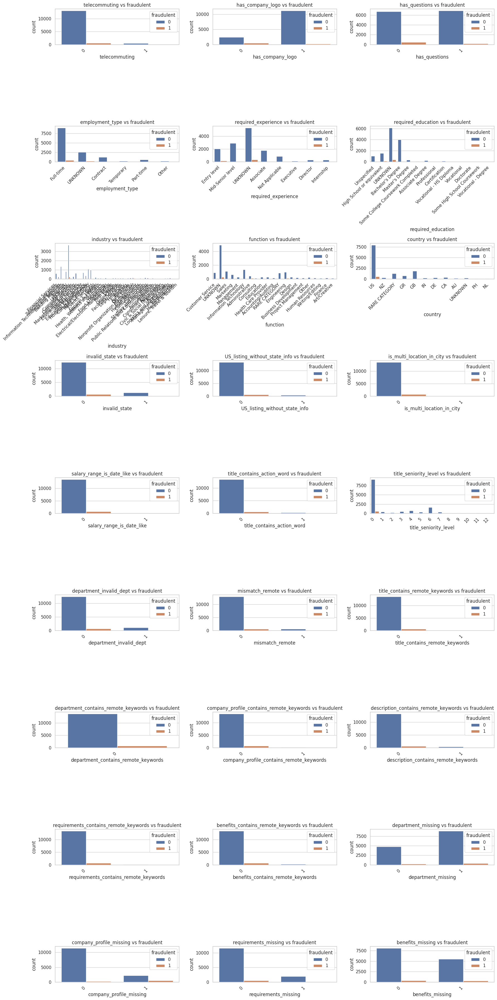

In [ ]:
plot_cat_vs_fraud(train_df, categorical_features)

In [ ]:
# Prints statistical summaries for each categorical feature:
  # Count per category
  # Fraud vs non-fraud count
  # Fraud rate
  # Percent distribution

def print_cat_stats(df, cat_cols, target="fraudulent"):

    for col in cat_cols:
        if col == target:
            continue

        print("=" * 80)
        print(f" COLUMN: {col}")
        print("=" * 80)

        # Basic stats
        print(f"• Unique categories: {df[col].nunique()}")
        print(f"• Missing values  : {df[col].isna().sum()}")

        # Value counts
        print("\nFrequency Distribution:")
        print(df[col].value_counts(dropna=False))

        # Fraud breakdown
        print("\nFraud Breakdown by Category:")
        fraud_table = (
            df.groupby(col)[target]
            .value_counts()
            .unstack(fill_value=0)
            .rename(columns={0: "Non-Fraud", 1: "Fraud"})
        )
        print(fraud_table)

        # Fraud rate
        print("\nFraud Rate (%):")
        fraud_rate = (fraud_table["Fraud"] / fraud_table.sum(axis=1) * 100).round(2)
        print(fraud_rate.sort_values(ascending=False))

        # Percent distribution
        print("\nPercentage Distribution (%):")
        percent_dist = (df[col].value_counts(normalize=True) * 100).round(2)
        print(percent_dist)

        print("\n\n")

In [ ]:
print_cat_stats(train_df, categorical_features)

 COLUMN: telecommuting
• Unique categories: 2
• Missing values  : 0

Frequency Distribution:
telecommuting
0    13709
1      595
Name: count, dtype: int64

Fraud Breakdown by Category:
fraudulent     Non-Fraud  Fraud
telecommuting                  
0                  13069    640
1                    542     53

Fraud Rate (%):
telecommuting
1    8.91
0    4.67
dtype: float64

Percentage Distribution (%):
telecommuting
0    95.84
1     4.16
Name: proportion, dtype: float64



 COLUMN: has_company_logo
• Unique categories: 2
• Missing values  : 0

Frequency Distribution:
has_company_logo
1    11343
0     2961
Name: count, dtype: int64

Fraud Breakdown by Category:
fraudulent        Non-Fraud  Fraud
has_company_logo                  
0                      2482    479
1                     11129    214

Fraud Rate (%):
has_company_logo
0    16.18
1     1.89
dtype: float64

Percentage Distribution (%):
has_company_logo
1    79.3
0    20.7
Name: proportion, dtype: float64



 COLUMN: has_q

## b. Numerical Features

In [ ]:
# Plots KDE plots to see the difference between fraud and non-fraud for each numerical feature
def plot_num_vs_fraud(df, num_cols, target="fraudulent", cols=3):
    sns.set(style="whitegrid")

    total = len(num_cols)
    rows = (total + cols - 1) // cols

    plt.figure(figsize=(6 * cols, 4 * rows))
    plot_index = 1

    for col in num_cols:
        plt.subplot(rows, cols, plot_index)
        sns.kdeplot(data=df, x=col, hue=target, fill=True, common_norm=False, alpha=0.4, warn_singular=False)
        plt.title(f"{col} (KDE by {target})")
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plot_index += 1

    plt.show()

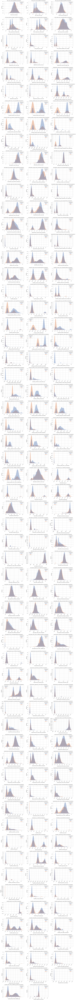

In [ ]:
plot_num_vs_fraud(train_df, numerical_features)

# Quantitative Analysis

## a. Mutual Information (for both categorical & numerical features)

In [ ]:
# Computes mutual information for all features
# Produces sorted MI table and plots elbow threshold
# Does not drop any feature at thsi point
def compute_MI_all_features(df, categorical_features, numerical_features, target_col):
    # Combine feature list
    feature_cols = categorical_features + numerical_features
    valid_features = [f for f in feature_cols if f in df.columns]

    X = df[valid_features].copy()
    y = df[target_col]

    # Detect categorical columns
    cat_cols = [col for col in valid_features if X[col].dtype == "object"]

    # Encode categoricals
    for col in cat_cols:
        X[col] = LabelEncoder().fit_transform(X[col].astype(str))

    discrete_flags = [col in cat_cols for col in valid_features]

    # Compute MI
    mi_scores = mutual_info_classif(
        X, y,
        discrete_features=discrete_flags,
        random_state=42
    )

    # Build sorted MI DataFrame
    mi_df = (
        pd.DataFrame({"Feature": valid_features, "Mutual_Information": mi_scores})
        .sort_values(by="Mutual_Information", ascending=False)
        .reset_index(drop=True)
    )

    print("\n==================== MUTUAL INFORMATION (Sorted) ====================")
    display(mi_df)

    # Extract sorted MI values
    y_vals = mi_df["Mutual_Information"].values
    x_vals = np.arange(len(mi_df))


    #-- 1. Obtaining threshol estimate by the elbow method: The point where the curve schanges shape from "steep" to "flat"
    # i.e. the point of diminishing returns
    knee = KneeLocator(
        x_vals, y_vals,
        curve="concave", # MI curve shape
        direction="decreasing" # MI decreases as index increases
    )

    elbow_threshold_est = (
        mi_df.loc[knee.knee, "Mutual_Information"] if knee.knee is not None else None
    )
    print(f"\nElbow Threshold Estimate = {elbow_threshold_est}")


    #-- 2. Steepest Local Drop: The single biggest drop between consecutive values
    diffs = np.diff(y_vals) # MI[i+1] - MI[i]
    steepest_idx = np.argmin(diffs) # largest negative drop
    steepest_drop_threshold_est = y_vals[steepest_idx]

    print(f"Steepest-Drop Threshold Estimate = {steepest_drop_threshold_est}")

    # Plot MI values
    plt.figure(figsize=(10, 6))
    plt.plot(y_vals, marker="o")

    if elbow_threshold_est is not None:
        plt.axhline(elbow_threshold_est, color="red", linestyle="--",
                    label=f"Elbow = {elbow_threshold_est}")

    plt.axhline(steepest_drop_threshold_est, color="green", linestyle="--",
                label=f"Steepest Drop = {steepest_drop_threshold_est}")

    plt.title("Mutual Information Scores (Sorted)")
    plt.xlabel("Feature Index (sorted)")
    plt.ylabel("Mutual Information")
    plt.legend()
    plt.tight_layout()
    plt.show()

    return mi_df, elbow_threshold_est, steepest_drop_threshold_est




# Select features by MI > threshold
# Returns:
  # selected_df: MI > threshold
  # dropped_df: Mi <= threshold
  # mi_numerical_features: selected numerical features based on specified MI threshold
  # mi_categorical_features: selected categorical features based on specified MI threshold
def select_features_by_threshold(
    mi_df,
    categorical_features,
    numerical_features,
    threshold
):
    selected_df = mi_df[mi_df["Mutual_Information"] > threshold]
    dropped_df  = mi_df[mi_df["Mutual_Information"] <= threshold]

    selected_features = selected_df["Feature"].tolist()

    # Split into numeric vs categorical
    mi_numerical_features = [f for f in selected_features if f in numerical_features]
    mi_categorical_features = [f for f in selected_features if f in categorical_features]

    print(f"\n==================== SELECTED FEATURES (Threshold = {threshold}) ====================")
    display(selected_df)

    print(f"\n==================== DROPPED FEATURES (Threshold = {threshold}) ====================")
    display(dropped_df)

    print("\nSelected Numerical Features:")
    print(mi_numerical_features)

    print("\nSelected Categorical Features:")
    print(mi_categorical_features)

    return selected_df, dropped_df, mi_numerical_features, mi_categorical_features


==================== MUTUAL INFORMATION (Sorted) ====================


,Feature,Mutual_Information
0,company_profile_uppercase_ratio,0.093414
1,company_profile_special_char_ratio,0.089266
2,company_profile_unique_char_normalised,0.089042
3,company_profile_gunning_fog,0.088536
4,company_profile_flesch_score,0.088234
5,company_profile_objective_score,0.084832
6,company_profile_avg_word_length_log,0.084345
7,company_profile_POS_NOUN_normalised,0.083113
8,company_profile_char_count_log,0.083055
9,company_profile_unique_word_normalised,0.080470



Elbow Threshold Estimate = 0.0
Steepest-Drop Threshold Estimate = 0.0598702816307648


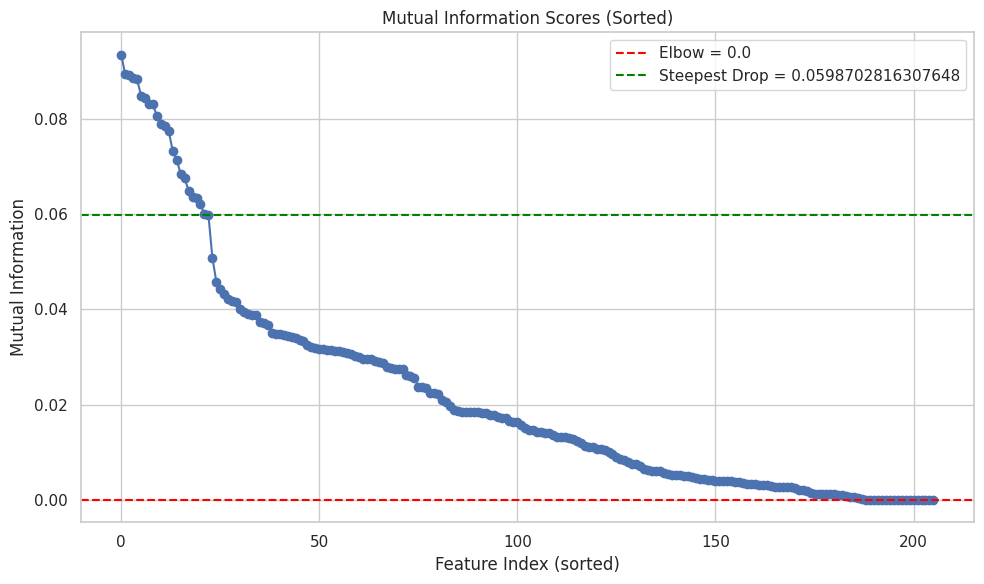

In [ ]:
mi_df, elbow_threshold_est, steep_threshold_est = compute_MI_all_features(
    train_df,
    categorical_features,
    numerical_features,
    target_col="fraudulent"
)

# Based on the mutual information scores, only do an initial filtering of features with MI == 0.0.

In [ ]:
selected_df, dropped_df, mi_num_feats, mi_cat_feats = select_features_by_threshold(
    mi_df,
    categorical_features,
    numerical_features,
    threshold=0.0
)


==================== SELECTED FEATURES (Threshold = 0.0) ====================


,Feature,Mutual_Information
0,company_profile_uppercase_ratio,0.093414
1,company_profile_special_char_ratio,0.089266
2,company_profile_unique_char_normalised,0.089042
3,company_profile_gunning_fog,0.088536
4,company_profile_flesch_score,0.088234
5,company_profile_objective_score,0.084832
6,company_profile_avg_word_length_log,0.084345
7,company_profile_POS_NOUN_normalised,0.083113
8,company_profile_char_count_log,0.083055
9,company_profile_unique_word_normalised,0.080470



==================== DROPPED FEATURES (Threshold = 0.0) ====================


,Feature,Mutual_Information
188,is_multi_location_in_city,0.0
189,salary_range_is_date_like,0.0
190,mismatch_remote,0.0
191,benefits_missing,0.0
192,department_contains_remote_keywords,0.0
193,requirements_contains_remote_keywords,0.0
194,department_digit_ratio,0.0
195,requirements_missing,0.0
196,department_longest_repeated_chars_length_log,0.0
197,company_profile_has_url,0.0



Selected Numerical Features:
['company_profile_uppercase_ratio', 'company_profile_special_char_ratio', 'company_profile_unique_char_normalised', 'company_profile_gunning_fog', 'company_profile_flesch_score', 'company_profile_objective_score', 'company_profile_avg_word_length_log', 'company_profile_POS_NOUN_normalised', 'company_profile_char_count_log', 'company_profile_unique_word_normalised', 'company_profile_POS_ADJ_normalised', 'company_profile_POS_VERB_normalised', 'company_profile_sentiment_compound', 'company_profile_avg_sentence_length', 'company_profile_POS_PRON_normalised', 'company_profile_POS_CONJ_normalised', 'company_profile_POS_ADP_normalised', 'company_profile_sentiment_pos', 'company_profile_POS_PRT_normalised', 'company_profile_POS_TOTAL_TOKENS_log', 'company_profile_POS_DET_normalised', 'company_profile_POS_ADV_normalised', 'company_profile_word_count_log', 'company_profile_spelling_error_rate', 'company_profile_POS_NUM_normalised', 'company_profile_digit_ratio', 'de

## b. Numerical Features (Spearman Correlation)

In [ ]:
# Computes pairwise Spearman correlation for numerical features.
# Returns:
#     corr_df        → correlation matrix
#     corr_pairs_df  → long-form correlation table sorted by ABS correlation
def compute_spearman_correlations(df, numerical_features):
    # Compute Spearman correlation matrix
    corr_df = df[numerical_features].corr(method="spearman")

    # Convert to long-form pairs
    pairs = []
    n = len(numerical_features)

    for i in range(n):
        for j in range(i + 1, n):        # only upper triangle
            f1 = numerical_features[i]
            f2 = numerical_features[j]
            corr_val = corr_df.loc[f1, f2]
            pairs.append((f1, f2, corr_val, abs(corr_val)))

    corr_pairs_df = (
        pd.DataFrame(
            pairs,
            columns=["Feature_1", "Feature_2", "Spearman_Corr", "Abs_Corr"]
        )
        .sort_values(by="Abs_Corr", ascending=False)
        .reset_index(drop=True)
    )

    print("\n==================== SPEARMAN CORRELATION PAIRS (Sorted by |Corr|) ====================")
    display(corr_pairs_df)

    return corr_df, corr_pairs_df


# Detect 2 types of correlation threshold
def detect_correlation_thresholds(corr_pairs_df):
    abs_corr_vals = corr_pairs_df["Abs_Corr"].values
    x_vals = np.arange(len(abs_corr_vals))

    # 1. Kneedle elbow detection
    knee = KneeLocator(
        x_vals,
        abs_corr_vals,
        curve="convex",
        direction="decreasing"
    )

    elbow_threshold = abs_corr_vals[knee.knee] if knee.knee is not None else None


    # 2. Steepest local drop
    diffs = np.diff(abs_corr_vals)
    steepest_idx = np.argmin(diffs) # largest negative change
    steepest_drop = diffs[steepest_idx]
    steepest_threshold = abs_corr_vals[steepest_idx]  # value BEFORE drop


    # Plot sorted correlation values with the threshold estimate values
    plt.figure(figsize=(12, 6))
    plt.plot(abs_corr_vals, marker="o")

    # elbow
    if elbow_threshold is not None:
        plt.axvline(knee.knee, color='red', linestyle='--',
                    label=f'Elbow idx={knee.knee}, threshold={elbow_threshold:.4f}')
        plt.scatter(knee.knee, abs_corr_vals[knee.knee], color='red', s=80)

    # steepest drop
    plt.axvline(steepest_idx, color='green', linestyle='--',
                label=f'Steepest Drop idx={steepest_idx}, Δ={steepest_drop:.4f}')
    plt.scatter(steepest_idx, abs_corr_vals[steepest_idx], color='green', s=80)

    plt.title("Sorted ABS Spearman Correlations (High → Low)")
    plt.xlabel("Pair Index")
    plt.ylabel("ABS Spearman Correlation")
    plt.legend()
    plt.tight_layout()
    plt.show()

    return elbow_threshold, steepest_threshold, steepest_idx, steepest_drop

In [ ]:
corr_matrix, corr_pairs = compute_spearman_correlations(train_df, mi_num_feats)


==================== SPEARMAN CORRELATION PAIRS (Sorted by |Corr|) ====================


,Feature_1,Feature_2,Spearman_Corr,Abs_Corr
0,department_word_count_log,department_unique_word_normalised,0.999990,0.999990
1,department_word_count_log,department_avg_sentence_length_log,0.999903,0.999903
2,department_avg_sentence_length_log,department_unique_word_normalised,0.999892,0.999892
3,benefits_question_normalised,benefits_question_count_log,0.999783,0.999783
4,company_profile_POS_TOTAL_TOKENS_log,company_profile_word_count_log,0.999360,0.999360
5,company_profile_question_count_log,company_profile_question_normalised,0.999317,0.999317
6,benefits_word_count_log,benefits_POS_TOTAL_TOKENS_log,0.999113,0.999113
7,benefits_char_count_log,benefits_POS_TOTAL_TOKENS_log,0.998356,0.998356
8,benefits_exclamation_normalised,benefits_exclamation_count_log,0.998347,0.998347
9,company_profile_exclamation_normalised,company_profile_exclamation_count_log,0.997963,0.997963


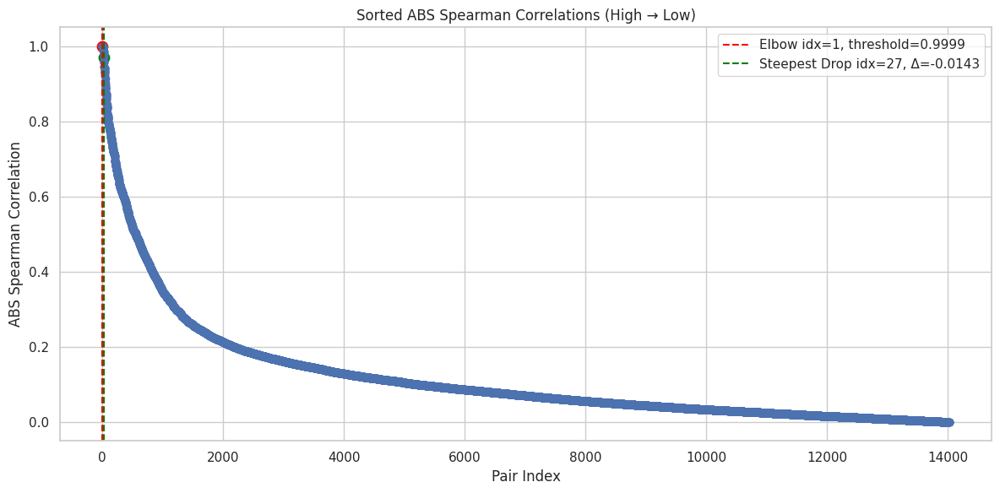

In [ ]:
num_elbow_threshold_est, num_steep_threshold_est, idx, drop = detect_correlation_thresholds(corr_pairs)

In [ ]:
print(num_elbow_threshold_est)
print(num_steep_threshold_est)

0.9999025012142132
0.9707080974339453


In [ ]:
# Removes redundant numerical features
# Obtain highly correlated numerical feature pairs: (i.e. correlation >= threshold)
  # For each highly correlated numerical feature pairs, retain the feature with a higher mutual information score.
def remove_redundant_numerical_features(corr_pairs_df, mi_df, threshold):
    # Convert MI to dict for fast lookup
    mi_scores = mi_df.set_index("Feature")["Mutual_Information"].to_dict()

    dropped = set()
    removal_log = []

    # Filter only pairs with |corr| >= threshold
    high_corr_pairs = corr_pairs_df[corr_pairs_df["Abs_Corr"] >= threshold]

    for _, row in high_corr_pairs.iterrows():
        f1 = row["Feature_1"]
        f2 = row["Feature_2"]
        corr_val = row["Abs_Corr"]

        # Skip if one already dropped earlier
        if f1 in dropped or f2 in dropped:
            continue

        # Look up MI scores
        mi1 = mi_scores.get(f1, -1)  # -1 ensures missing MI never wins
        mi2 = mi_scores.get(f2, -1)

        # Decide which feature to drop
        if mi1 >= mi2:
            dropped.add(f2)
            removal_log.append((f1, f2, corr_val, mi1, mi2))
        else:
            dropped.add(f1)
            removal_log.append((f2, f1, corr_val, mi2, mi1))

    # Compute retained list
    all_feats = set(corr_pairs_df["Feature_1"]).union(corr_pairs_df["Feature_2"])
    retained = [f for f in all_feats if f not in dropped]

    # Format removal log
    removal_df = pd.DataFrame(removal_log, columns=[
        "Feature_Kept", "Feature_Removed", "Abs_Corr", "MI_Kept", "MI_Removed"
    ]).sort_values("Abs_Corr", ascending=False)

    print("\nNumerical Redundancy Removal")
    print(f"Threshold = {threshold}")
    print(f"Removed {len(dropped)} redundant numerical features")
    print(f"Retained {len(retained)} numerical features\n")

    display(removal_df)

    return retained, list(dropped), removal_df

In [ ]:
mi_num_df = mi_df[mi_df["Feature"].isin(mi_num_feats)]
retained_num_feats, dropped_num_feats, num_log = remove_redundant_numerical_features(
    corr_pairs, mi_num_df, threshold=num_steep_threshold_est
)


Numerical Redundancy Removal
Threshold = 0.9707080974339453
Removed 21 redundant numerical features
Retained 147 numerical features



,Feature_Kept,Feature_Removed,Abs_Corr,MI_Kept,MI_Removed
0,department_word_count_log,department_unique_word_normalised,0.999990,0.003724,0.000999
1,department_word_count_log,department_avg_sentence_length_log,0.999903,0.003724,0.001241
2,benefits_question_normalised,benefits_question_count_log,0.999783,0.006168,0.002827
3,company_profile_POS_TOTAL_TOKENS_log,company_profile_word_count_log,0.999360,0.063282,0.059870
4,company_profile_question_count_log,company_profile_question_normalised,0.999317,0.004756,0.004041
5,benefits_word_count_log,benefits_POS_TOTAL_TOKENS_log,0.999113,0.011083,0.010523
6,benefits_exclamation_normalised,benefits_exclamation_count_log,0.998347,0.014354,0.000867
7,company_profile_exclamation_normalised,company_profile_exclamation_count_log,0.997963,0.023781,0.003062
8,requirements_word_count_log,requirements_POS_TOTAL_TOKENS_log,0.997712,0.018737,0.017763
9,benefits_char_count_log,benefits_word_count_log,0.997709,0.030025,0.011083


In [ ]:
retained_num_feats

['company_profile_sentiment_neg',
 'requirements_digit_ratio',
 'requirements_POS_ADP_normalised',
 'benefits_sentiment_pos',
 'requirements_has_url',
 'description_POS_VERB_normalised',
 'description_exclamation_normalised',
 'company_profile_avg_sentence_length',
 'description_gunning_fog_log',
 'company_profile_uppercase_ratio',
 'requirements_POS_ADJ_normalised',
 'benefits_avg_word_length_log',
 'description_POS_X_normalised',
 'benefits_special_char_ratio',
 'requirements_all_caps_words_normalised',
 'description_POS_PRT_normalised',
 'requirements_POS_PRT_normalised',
 'requirements_spelling_error_rate',
 'description_duplicated',
 'requirements_POS_ADV_normalised',
 'description_special_char_ratio',
 'benefits_spelling_error_rate',
 'requirements_avg_sentence_length_log',
 'description_objective_score',
 'description_POS_ADJ_normalised',
 'company_profile_sentiment_pos',
 'benefits_flesch_score',
 'requirements_POS_X_normalised',
 'title_avg_word_length_log',
 'description_POS_

## c. Categorical Features (Cramer's V)

In [ ]:
# Computes bias-corrected Cramér's V for all pairs of categorical variables.
# Returns an NxN symmetric matrix (DataFrame) with NaN on the diagonal.
def cramers_v_matrix(df, cat_features):
    n = len(cat_features)
    v_mat = pd.DataFrame(np.ones((n, n)), index=cat_features, columns=cat_features)

    for f1, f2 in itertools.combinations(cat_features, 2):

        contingency = pd.crosstab(df[f1], df[f2])
        chi2 = chi2_contingency(contingency)[0]
        n_obs = contingency.values.sum()

        phi2 = chi2 / n_obs
        r, k = contingency.shape

        # Bias correction (Bergsma & Wicher, 2013)
        phi2_corr = max(0, phi2 - ((k-1)*(r-1)) / (n_obs-1))
        r_corr = r - ((r-1)**2) / (n_obs-1)
        k_corr = k - ((k-1)**2) / (n_obs-1)

        denom = min((k_corr - 1), (r_corr - 1))
        v = np.sqrt(phi2_corr / denom) if denom > 0 else 0

        v_mat.loc[f1, f2] = v
        v_mat.loc[f2, f1] = v

    # Diagonal as NaN for clarity
    np.fill_diagonal(v_mat.values, np.nan)

    return v_mat



# Converts Craamér’s V matrix into long form.
def cramers_v_long_table(cramers_v_df):
    long_df = (
        cramers_v_df
        .where(~np.tril(np.ones(cramers_v_df.shape)).astype(bool))
        .stack()
        .reset_index()
        .rename(columns={'level_0': 'Feature_1', 'level_1': 'Feature_2', 0: 'CramersV'})
    )

    long_df['Abs_CramersV'] = long_df['CramersV'].abs()
    return long_df.sort_values("Abs_CramersV", ascending=False).reset_index(drop=True)



# Plots sorted Cramér’s V values and returns:
#   - elbow_threshold: Kneedle elbow threshold (or None)
#   - steepest_threshold: Value before the steepest drop
#   - steepest_idx: index of steepest drop
#   - steepest_drop: magnitude of steepest drop
def plot_cramers_v_elbow(cramers_v_df):


    # Extract upper triangle (no diagonal)
    vals = cramers_v_df.where(~np.tril(np.ones(cramers_v_df.shape)).astype(bool))
    vals = vals.stack().sort_values().values  # sorted low → high

    # Reverse to high → low
    vals_rev = vals[::-1]
    x = np.arange(len(vals_rev))

    #-- 1. Kneedle Elbow Detection
    knee = KneeLocator(x, vals_rev, curve='convex', direction='decreasing')
    elbow_threshold = vals_rev[knee.knee] if knee.knee is not None else None

    #-- 2. Steepest local drop
    diffs = np.diff(vals_rev)
    steepest_idx = np.argmin(diffs) # position of largest negative drop
    steepest_drop = diffs[steepest_idx] # negative number
    steepest_threshold = vals_rev[steepest_idx]   # value BEFORE the drop

    #-- 3. Plot the sorted cramer v's values + elbow and steepest drop thresholds
    plt.figure(figsize=(9, 4))
    plt.plot(vals_rev, marker='o', linewidth=1)

    # Kneedle line
    if elbow_threshold is not None:
        plt.axvline(knee.knee, color='red', linestyle='--',
                    label=f'Kneedle Elbow idx={knee.knee}, threshold={elbow_threshold:.4f}')
        plt.scatter(knee.knee, vals_rev[knee.knee], color='red', s=80)

    # Steepest drop line
    plt.axvline(steepest_idx, color='green', linestyle='--',
                label=f'Steepest Drop idx={steepest_idx}, Δ={steepest_drop:.4f}')
    plt.scatter(steepest_idx, vals_rev[steepest_idx], color='green', s=80)

    plt.title("Sorted Cramér’s V Values (High → Low)")
    plt.xlabel("Pair Index (sorted)")
    plt.ylabel("Cramér’s V")
    plt.legend()
    plt.tight_layout()
    plt.show()

    return elbow_threshold, steepest_threshold, steepest_idx, steepest_drop

In [ ]:
# Removes redundant categorical features
# Obtain highly associated categorical feature pairs: (i.e. score >= threshold)
  # For each highly associated categorical feature pairs, retain the feature with a higher mutual information score.
def remove_redundant_categoricals(cramers_v_df, mi_df, threshold):
    dropped = set()
    removal_log = []

    mi_scores = mi_df.set_index("Feature")["Mutual_Information"].to_dict()
    features = cramers_v_df.columns

    for f1, f2 in itertools.combinations(features, 2):

        v = cramers_v_df.loc[f1, f2]

        if pd.notna(v) and v >= threshold:

            mi1 = mi_scores.get(f1, 0)
            mi2 = mi_scores.get(f2, 0)

            # Keep feature with higher MI
            if mi1 >= mi2:
                dropped.add(f2)
                removal_log.append((f1, f2, v, mi1, mi2))
            else:
                dropped.add(f1)
                removal_log.append((f2, f1, v, mi2, mi1))

    retained = [f for f in features if f not in dropped]

    print(f"\nRedundancy threshold: Cramér's V >= {threshold}")
    print(f"Removed {len(dropped)} redundant features")
    print(f"Retained {len(retained)} categorical features\n")

    # Print detailed removal table
    if removal_log:
        removal_df = pd.DataFrame(removal_log, columns=[
            "Feature_Kept", "Feature_Removed", "CramersV", "MI_Kept", "MI_Removed"
        ]).sort_values("CramersV", ascending=False)

        print("Detailed Redundant Pairs Removed:")
        display(removal_df)

    return retained, list(dropped)

In [ ]:
# Compute Cramér’s V matrix
cramers_v_df = cramers_v_matrix(train_df, mi_cat_feats)

# Inspect Cramér’s V pairs
cramers_v_long = cramers_v_long_table(cramers_v_df)
cramers_v_long

,Feature_1,Feature_2,CramersV,Abs_CramersV
0,country,invalid_state,0.787364,0.787364
1,company_profile_missing,has_company_logo,0.694771,0.694771
2,industry,employment_type,0.462395,0.462395
3,department_missing,department_invalid_dept,0.403790,0.403790
4,required_experience,title_seniority_level,0.371003,0.371003
5,function,department_invalid_dept,0.338887,0.338887
6,industry,function,0.315199,0.315199
7,function,required_experience,0.314727,0.314727
8,required_education,required_experience,0.308196,0.308196
9,function,employment_type,0.302000,0.302000


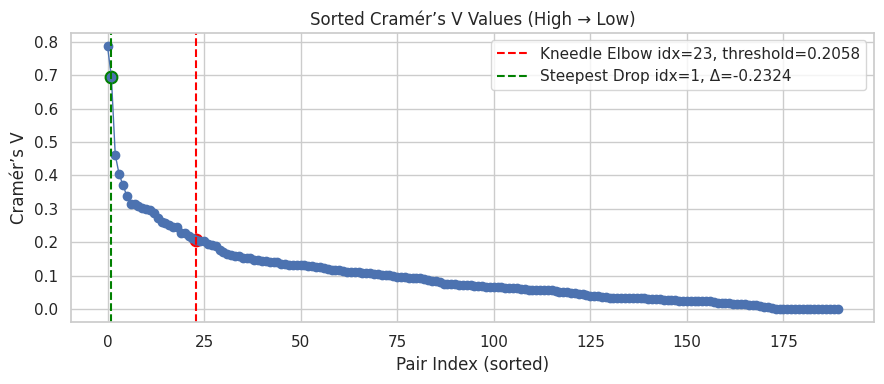

In [ ]:
cat_elbow_threshold_est, cat_steep_threshold_est, idx, drop = plot_cramers_v_elbow(cramers_v_df)

In [ ]:
# Filter MI table for categorical features only
mi_cat_df = mi_df[mi_df["Feature"].isin(mi_cat_feats)]

retained_cat_feats, dropped_cat_feats = remove_redundant_categoricals(
    cramers_v_df, mi_cat_df, threshold=cat_steep_threshold_est
)


Redundancy threshold: Cramér's V >= 0.6947706413571718
Removed 2 redundant features
Retained 18 categorical features

Detailed Redundant Pairs Removed:


,Feature_Kept,Feature_Removed,CramersV,MI_Kept,MI_Removed
1,country,invalid_state,0.787364,0.013134,0.003230
0,company_profile_missing,has_company_logo,0.694771,0.032411,0.029523


In [ ]:
retained_cat_feats

['company_profile_missing',
 'industry',
 'country',
 'function',
 'required_education',
 'has_questions',
 'description_contains_remote_keywords',
 'department_missing',
 'required_experience',
 'title_contains_action_word',
 'title_seniority_level',
 'employment_type',
 'US_listing_without_state_info',
 'benefits_contains_remote_keywords',
 'title_contains_remote_keywords',
 'telecommuting',
 'company_profile_contains_remote_keywords',
 'department_invalid_dept']

# Selected features (and text columns)

In [ ]:
text_cols_raw = [
    "company_profile_noencoded",
    "description_noencoded",
    "requirements_noencoded",
    "benefits_noencoded"
]

for col in text_cols_raw:
    train_df[col] = train_df[col].fillna("")
    test_df[col] = test_df[col].fillna("")

In [ ]:
final_selected_features = ['job_id', 'fraudulent'] \
    + ['company_profile_noencoded', 'description_noencoded', 'requirements_noencoded', 'benefits_noencoded'] \
    + retained_num_feats \
    + retained_cat_feats

train_df_with_selected_features = train_df[final_selected_features]
test_df_with_selected_features = test_df[final_selected_features]

In [ ]:
final_selected_features

['job_id',
 'fraudulent',
 'company_profile_noencoded',
 'description_noencoded',
 'requirements_noencoded',
 'benefits_noencoded',
 'company_profile_sentiment_neg',
 'requirements_digit_ratio',
 'requirements_POS_ADP_normalised',
 'benefits_sentiment_pos',
 'requirements_has_url',
 'description_POS_VERB_normalised',
 'description_exclamation_normalised',
 'company_profile_avg_sentence_length',
 'description_gunning_fog_log',
 'company_profile_uppercase_ratio',
 'requirements_POS_ADJ_normalised',
 'benefits_avg_word_length_log',
 'description_POS_X_normalised',
 'benefits_special_char_ratio',
 'requirements_all_caps_words_normalised',
 'description_POS_PRT_normalised',
 'requirements_POS_PRT_normalised',
 'requirements_spelling_error_rate',
 'description_duplicated',
 'requirements_POS_ADV_normalised',
 'description_special_char_ratio',
 'benefits_spelling_error_rate',
 'requirements_avg_sentence_length_log',
 'description_objective_score',
 'description_POS_ADJ_normalised',
 'company_

In [ ]:
print(f"(Before Feature Selection) Initial No. of Features: {len(categorical_features) + len(numerical_features)}")
print(f"(After Feature Selection) Final No. of Features: {len(final_selected_features) - 2 - 4}")

(Before Feature Selection) Initial No. of Features: 206
(After Feature Selection) Final No. of Features: 165


In [ ]:
train_df.isna().sum()

,0
job_id,0
title,0
location,280
department,9280
salary_range,12021
company_profile,0
description,0
requirements,0
benefits,0
telecommuting,0


In [ ]:
test_df.isna().sum()

,0
job_id,0
title,0
location,66
department,2273
salary_range,2991
company_profile,0
description,0
requirements,0
benefits,0
telecommuting,0


In [ ]:
train_df_with_selected_features.to_csv(f"{FILE_PATH}selected_train_df.csv", index=False)
test_df_with_selected_features.to_csv(f"{FILE_PATH}selected_test_df.csv", index=False)

# Final selected features (with one-hot encoding) for downstream ML models

In [ ]:
# Examine retained categorical features
retained_cat_feats

['company_profile_missing',
 'industry',
 'country',
 'function',
 'required_education',
 'has_questions',
 'description_contains_remote_keywords',
 'department_missing',
 'required_experience',
 'title_contains_action_word',
 'title_seniority_level',
 'employment_type',
 'US_listing_without_state_info',
 'benefits_contains_remote_keywords',
 'title_contains_remote_keywords',
 'telecommuting',
 'company_profile_contains_remote_keywords',
 'department_invalid_dept']

In [ ]:
from sklearn.preprocessing import OneHotEncoder
import pandas as pd

def fit_ohe_encoder(df_train, multi_cat_feats):
    """
    Fits a OneHotEncoder on the training dataframe.
    Returns fitted encoder and the encoded train dataframe.
    """
    encoder = OneHotEncoder(
        handle_unknown="ignore",
        sparse_output=False,
        dtype='int'   # ensures output is 0/1 integers
    )

    # Fit on train
    encoder.fit(df_train[multi_cat_feats].astype(str))

    # Transform train
    train_encoded = encoder.transform(df_train[multi_cat_feats].astype(str))

    # Get encoded column names
    encoded_cols = encoder.get_feature_names_out(multi_cat_feats)

    # Create encoded df
    train_encoded_df = pd.DataFrame(train_encoded, columns=encoded_cols, index=df_train.index)

    # Drop original categorical columns and concat encoded ones
    df_train_out = pd.concat(
        [df_train.drop(columns=multi_cat_feats), train_encoded_df],
        axis=1
    )

    return encoder, df_train_out


# Uses a fitted encoder to transform any dataframe (train/test).
# Ensures consistent column names.

def transform_ohe(df, encoder, multi_cat_feats):

    encoded = encoder.transform(df[multi_cat_feats].astype(str))
    encoded_cols = encoder.get_feature_names_out(multi_cat_feats)

    encoded_df = pd.DataFrame(encoded, columns=encoded_cols, index=df.index)

    df_out = pd.concat(
        [df.drop(columns=multi_cat_feats), encoded_df],
        axis=1
    )

    return df_out

In [ ]:
multi_cat_feats = [
    "industry", "country", "function",
    "required_education", "required_experience",
    "employment_type"
]

# Fit on train
ohe_encoder, train_df_encoded = fit_ohe_encoder(train_df_with_selected_features, multi_cat_feats)

# Transform test using same encoder
test_df_encoded = transform_ohe(test_df_with_selected_features, ohe_encoder, multi_cat_feats)

In [ ]:
train_df_encoded.to_csv(f"{FILE_PATH}ohe_selected_train_df.csv", index=False)
test_df_encoded.to_csv(f"{FILE_PATH}ohe_selected_test_df.csv", index=False)

In [ ]:
print(train_df_encoded.shape)

(14304, 276)


In [ ]:
test_df_encoded.isna().sum()

,0
job_id,0
fraudulent,0
company_profile_noencoded,0
description_noencoded,0
requirements_noencoded,0
benefits_noencoded,0
company_profile_sentiment_neg,0
requirements_digit_ratio,0
requirements_POS_ADP_normalised,0
benefits_sentiment_pos,0


In [ ]:
def get_final_cat_features(retained_cat_feats, multi_cat_feats, encoder):
    """
    Create final categorical feature list after OHE.
    Removes multi_cat_feats and adds encoder-generated OHE columns.
    """
    # Step 1: Remove original multi-category columns
    remaining_cats = [c for c in retained_cat_feats if c not in multi_cat_feats]

    # Step 2: Get the names of OHE columns created by the encoder
    ohe_cols = encoder.get_feature_names_out(multi_cat_feats).tolist()

    # Step 3: Combine into final list
    final_cat_features = remaining_cats + ohe_cols

    return final_cat_features


In [ ]:
final_cat_features = get_final_cat_features(
    retained_cat_feats,
    multi_cat_feats,
    ohe_encoder
)

final_cat_features

['company_profile_missing',
 'has_questions',
 'description_contains_remote_keywords',
 'department_missing',
 'title_contains_action_word',
 'title_seniority_level',
 'US_listing_without_state_info',
 'benefits_contains_remote_keywords',
 'title_contains_remote_keywords',
 'telecommuting',
 'company_profile_contains_remote_keywords',
 'department_invalid_dept',
 'industry_Accounting',
 'industry_Airlines/Aviation',
 'industry_Apparel & Fashion',
 'industry_Automotive',
 'industry_Banking',
 'industry_Building Materials',
 'industry_Civic & Social Organization',
 'industry_Computer Games',
 'industry_Computer Software',
 'industry_Construction',
 'industry_Consumer Electronics',
 'industry_Consumer Goods',
 'industry_Consumer Services',
 'industry_Cosmetics',
 'industry_Design',
 'industry_E-Learning',
 'industry_Education Management',
 'industry_Electrical/Electronic Manufacturing',
 'industry_Entertainment',
 'industry_Environmental Services',
 'industry_Events Services',
 'industry_

In [ ]:
retained_num_feats

['company_profile_sentiment_neg',
 'requirements_digit_ratio',
 'requirements_POS_ADP_normalised',
 'benefits_sentiment_pos',
 'requirements_has_url',
 'description_POS_VERB_normalised',
 'description_exclamation_normalised',
 'company_profile_avg_sentence_length',
 'description_gunning_fog_log',
 'company_profile_uppercase_ratio',
 'requirements_POS_ADJ_normalised',
 'benefits_avg_word_length_log',
 'description_POS_X_normalised',
 'benefits_special_char_ratio',
 'requirements_all_caps_words_normalised',
 'description_POS_PRT_normalised',
 'requirements_POS_PRT_normalised',
 'requirements_spelling_error_rate',
 'description_duplicated',
 'requirements_POS_ADV_normalised',
 'description_special_char_ratio',
 'benefits_spelling_error_rate',
 'requirements_avg_sentence_length_log',
 'description_objective_score',
 'description_POS_ADJ_normalised',
 'company_profile_sentiment_pos',
 'benefits_flesch_score',
 'requirements_POS_X_normalised',
 'title_avg_word_length_log',
 'description_POS_